In [2]:
pip install livelossplot

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 37.9 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import PIL
from collections import defaultdict
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
import shutil
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Dense
from keras.layers import BatchNormalization, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from livelossplot import PlotLossesKeras
from sklearn.metrics import confusion_matrix, classification_report
import cv2
import mediapipe as mp
from PIL import Image

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [5]:
base = '/kaggle/input/hand-gesture-recognition-dataset-one-hand/Dataset_RGB/Dataset_RGB'

In [6]:
st = {}
for i in os.listdir(base):
    st[i] = len(os.listdir(os.path.join(base, i)))

In [7]:
count = pd.DataFrame(st.values(), index=st.keys())
count.columns=['count']

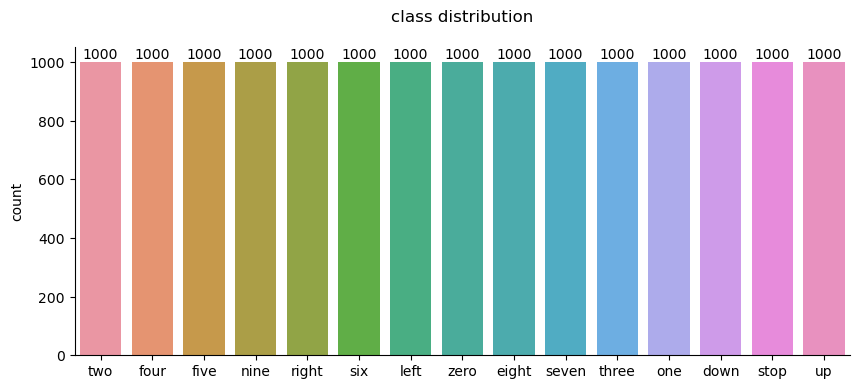

In [8]:
sns.barplot(count,x=count.index, y='count')
fig = plt.gcf()
fig.set_size_inches(10,4)
ax = plt.gca()
for i in ax.containers:
    plt.bar_label(i)
plt.title('class distribution\n')
ax.spines[['top','right']].set_visible(False);

### take a look at the images

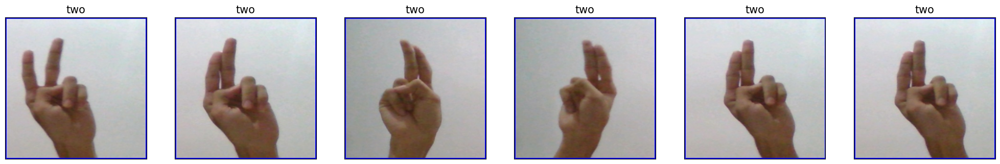

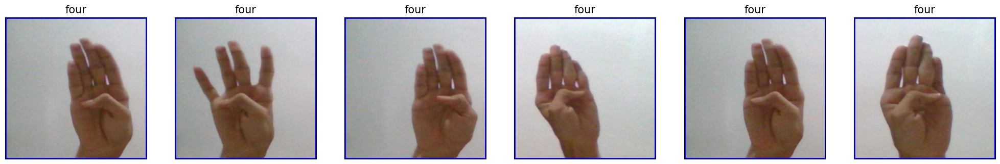

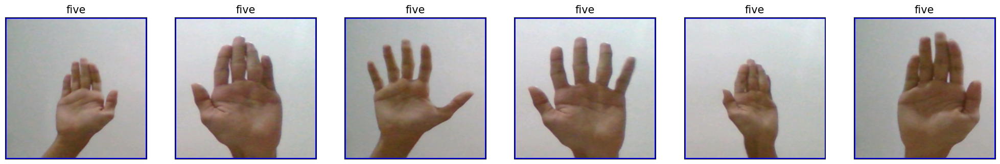

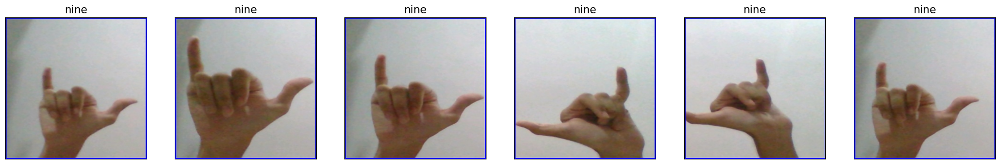

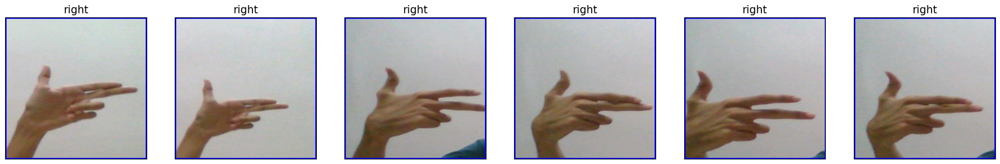

...

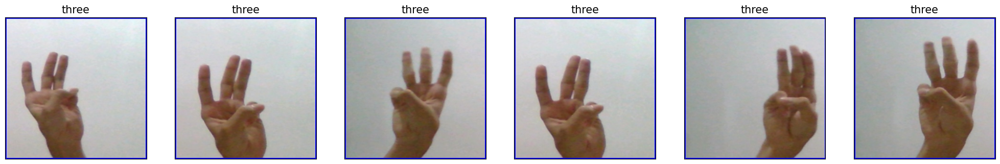

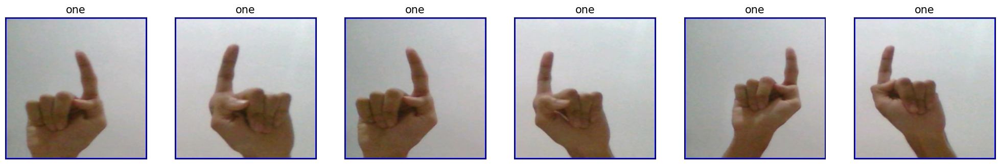

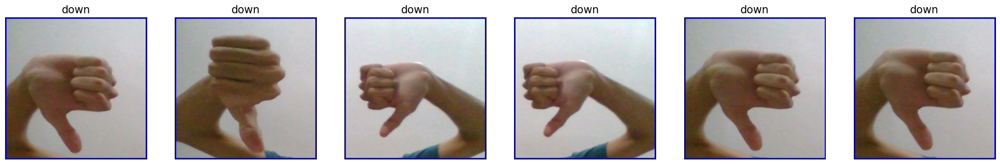

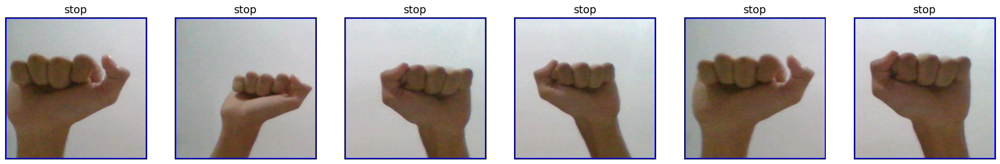

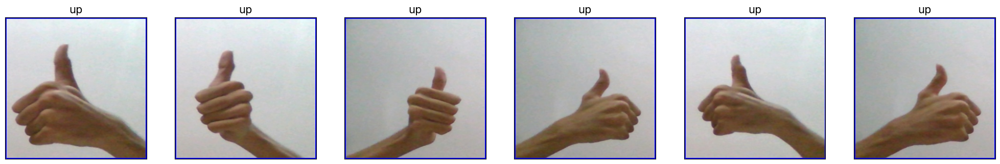

In [9]:
for i in os.listdir(base):
    imgs = os.listdir(os.path.join(base, i))
    sample_imgs = random.sample(imgs, 6)
    
    fig, axes = plt.subplots(1,6, figsize=(25,4), subplot_kw=dict(xticks=[], yticks=[]))
    for num, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(os.path.join(base, i, sample_imgs[num])))
        ax.set_title(i, size=15)

In [10]:
sample = '/kaggle/input/hand-gesture-recognition-dataset-one-hand/Dataset_RGB/Dataset_RGB/four/img 1.jpg'

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


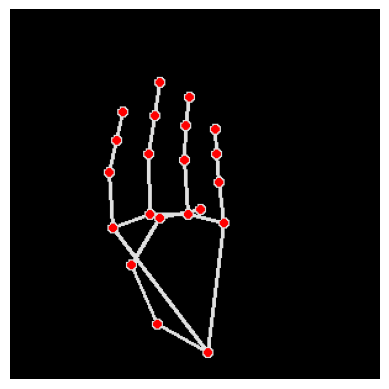

In [11]:
img = cv2.imread(sample)
black = np.zeros(img.shape, dtype="uint8")
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mpHands = mp.solutions.hands
hands = mpHands.Hands(static_image_mode=False,
                      max_num_hands=2,
                      min_detection_confidence=0.5,
                      min_tracking_confidence=0.5)
mpDraw = mp.solutions.drawing_utils

results = hands.process(imgRGB)
if results.multi_hand_landmarks:
        for handLms in results.multi_hand_landmarks:
            for id, lm in enumerate(handLms.landmark):
                # print(id,lm)
                h, w, c = img.shape
                cx, cy = int(lm.x * w), int(lm.y * h)
                cv2.circle(black, (cx, cy), 3, (255, 0, 255), cv2.FILLED)
            mpDraw.draw_landmarks(black, handLms, mpHands.HAND_CONNECTIONS)
            
plt.imshow(black[:,:,::-1])
plt.axis('off');

### split the dataset

In [12]:
def make_dir(path):
    if not os.path.exists(path):
        os.mkdir(path)

In [13]:
output_dir = '/kaggle/working'

In [14]:
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'val')
test_dir = os.path.join(output_dir, 'test')

In [15]:
make_dir(train_dir)
make_dir(val_dir)
make_dir(test_dir)

In [16]:
for i in os.listdir(base):
    for j in ['train', 'val','test']:
        make_dir(os.path.join(j,i))

In [17]:
for i in os.listdir(base):
    total_imgs = os.listdir(os.path.join(base, i))
    Xtrain, Xvaltest = train_test_split(total_imgs, test_size=0.3)
    Xval, Xtest = train_test_split(Xvaltest, test_size=0.5)
    
    for tr in Xtrain:
        sample = os.path.join(base, i, tr)
        img = cv2.imread(sample)
        black = np.zeros(img.shape, dtype="uint8")
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = hands.process(imgRGB)
        if results.multi_hand_landmarks:
                for handLms in results.multi_hand_landmarks:
                    for id, lm in enumerate(handLms.landmark):
                        # print(id,lm)
                        h, w, c = img.shape
                        cx, cy = int(lm.x * w), int(lm.y * h)
                        cv2.circle(black, (cx, cy), 3, (255, 0, 255), cv2.FILLED)
                    mpDraw.draw_landmarks(black, handLms, mpHands.HAND_CONNECTIONS)
                    
        skeleton_img = Image.fromarray(black)
        skeleton_img.save(os.path.join(train_dir, i, tr))
        
        
        
        
    for v in Xval:
        sample = os.path.join(base, i, v)
        img = cv2.imread(sample)
        black = np.zeros(img.shape, dtype="uint8")
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = hands.process(imgRGB)
        if results.multi_hand_landmarks:
                for handLms in results.multi_hand_landmarks:
                    for id, lm in enumerate(handLms.landmark):
                        # print(id,lm)
                        h, w, c = img.shape
                        cx, cy = int(lm.x * w), int(lm.y * h)
                        cv2.circle(black, (cx, cy), 3, (255, 0, 255), cv2.FILLED)
                    mpDraw.draw_landmarks(black, handLms, mpHands.HAND_CONNECTIONS)
                    
        skeleton_img = Image.fromarray(black)
        skeleton_img.save(os.path.join(val_dir, i, v))
        
        
        
        
    for te in Xtest:
        sample = os.path.join(base, i, te)
        img = cv2.imread(sample)
        black = np.zeros(img.shape, dtype="uint8")
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = hands.process(imgRGB)
        if results.multi_hand_landmarks:
                for handLms in results.multi_hand_landmarks:
                    for id, lm in enumerate(handLms.landmark):
                        # print(id,lm)
                        h, w, c = img.shape
                        cx, cy = int(lm.x * w), int(lm.y * h)
                        cv2.circle(black, (cx, cy), 3, (255, 0, 255), cv2.FILLED)
                    mpDraw.draw_landmarks(black, handLms, mpHands.HAND_CONNECTIONS)
                    
        skeleton_img = Image.fromarray(black)
        skeleton_img.save(os.path.join(test_dir, i, te))

In [18]:
for i in os.listdir(base):
    print(f'there are {len(os.listdir(os.path.join(train_dir, i)))} images in the train dataset for class [{i}]')
    print(f'there are {len(os.listdir(os.path.join(val_dir, i)))} images in the val dataset for class [{i}]')
    print(f'there are {len(os.listdir(os.path.join(test_dir, i)))} images in the test dataset for class [{i}]\n')

there are 700 images in the train dataset for class [two]
there are 150 images in the val dataset for class [two]
there are 150 images in the test dataset for class [two]

there are 700 images in the train dataset for class [four]
there are 150 images in the val dataset for class [four]
there are 150 images in the test dataset for class [four]

there are 700 images in the train dataset for class [five]
there are 150 images in the val dataset for class [five]
there are 150 images in the test dataset for class [five]

there are 700 images in the train dataset for class [nine]
there are 150 images in the val dataset for class [nine]
there are 150 images in the test dataset for class [nine]

there are 700 images in the train dataset for class [right]
there are 150 images in the val dataset for class [right]
there are 150 images in the test dataset for class [right]

there are 700 images in the train dataset for class [six]
there are 150 images in the val dataset for class [six]
there are 1

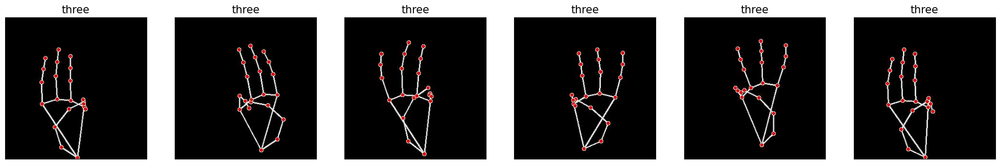

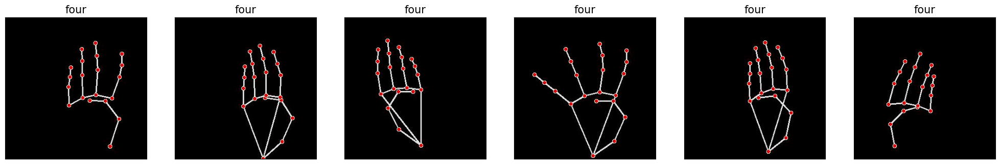

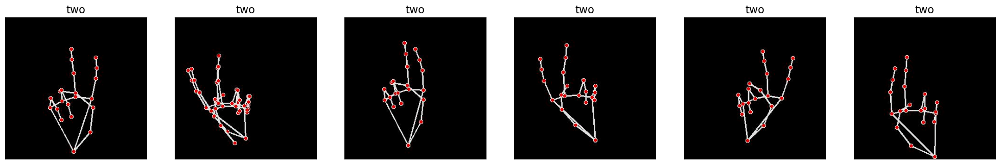

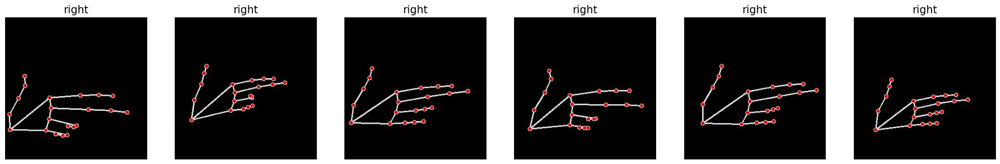

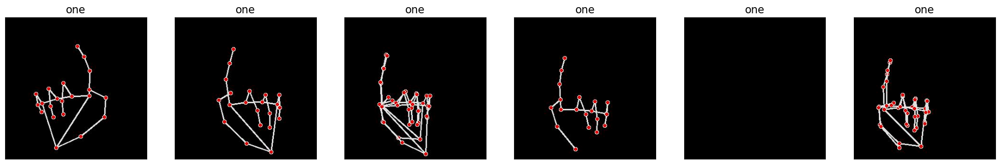

...

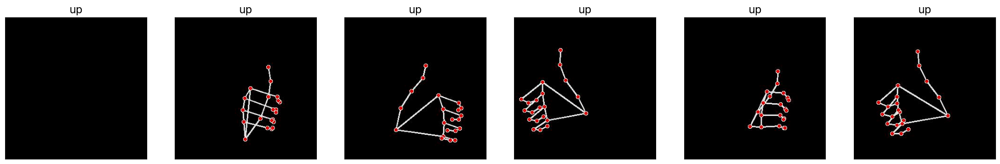

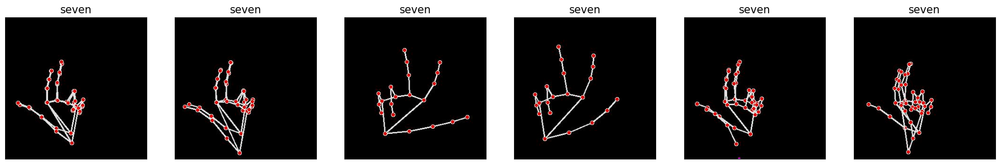

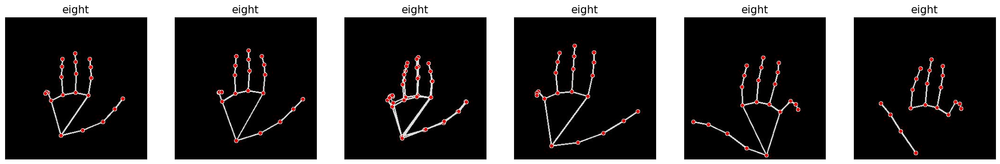

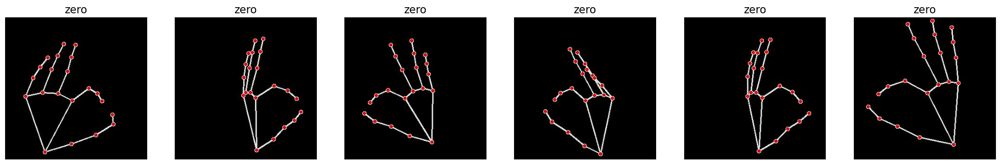

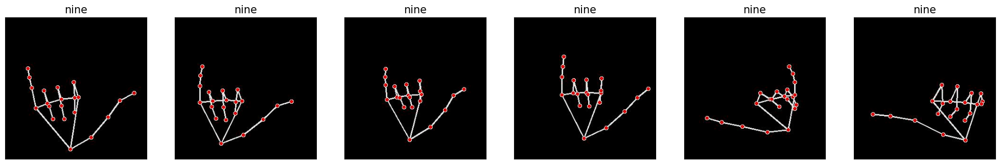

In [31]:
for i in os.listdir(train_dir):
    imgs = os.listdir(os.path.join(train_dir, i))
    sample_imgs = random.sample(imgs, 6)
    
    fig, axes = plt.subplots(1,6, figsize=(25,4), subplot_kw=dict(xticks=[], yticks=[]))
    for num, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(os.path.join(train_dir, i, sample_imgs[num]))[:,:,::-1])
        ax.set_title(i, size=15)

### build the model

In [22]:
train_generator = ImageDataGenerator(rescale=1.0 / 255, 
                                     horizontal_flip=True, 
                                     zoom_range=0.1, 
                                     shear_range=0.2, 
                                     width_shift_range=0.1,
                                     height_shift_range=0.1, 
                                     rotation_range=4, 
                                     vertical_flip=False)

validation_generator = ImageDataGenerator(rescale=1./255)

test_generator = ImageDataGenerator(rescale=1./255)

In [23]:
train_data_gen = train_generator.flow_from_directory(train_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=True)

validation_data_gen = validation_generator.flow_from_directory(val_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=False)

test_data_gen = test_generator.flow_from_directory(test_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=False)

Found 10500 images belonging to 15 classes.
Found 2250 images belonging to 15 classes.
Found 2250 images belonging to 15 classes.


In [24]:
model = Sequential()
model.add(Conv2D(filters = 64, kernel_size = 3,  padding='same', activation = 'relu', input_shape = (48,48,3)))
model.add(MaxPooling2D(pool_size = 2))
model.add(Conv2D(filters = 64, kernel_size = 3,  padding='same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = 2))
model.add(Conv2D(filters = 256, kernel_size = 3,  padding='same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = 2))
model.add(Flatten())
model.add(Dense(units = 512, activation = 'relu'))
model.add(Dense(15,activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 12, 12, 256)       147712    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 6, 6, 256)        0

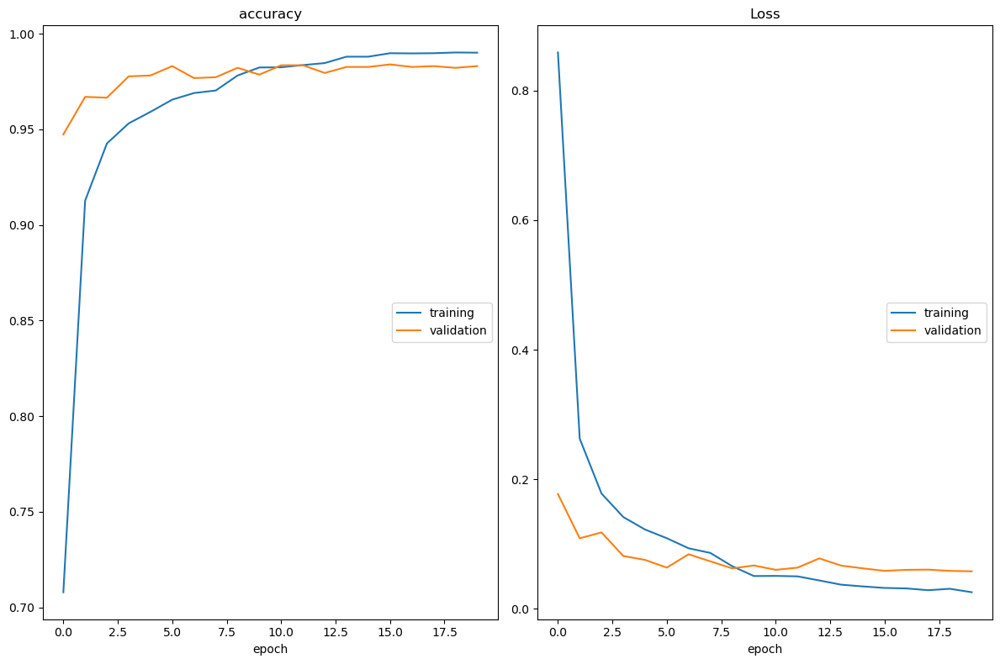

accuracy
	training         	 (min:    0.708, max:    0.990, cur:    0.990)
	validation       	 (min:    0.947, max:    0.984, cur:    0.983)
Loss
	training         	 (min:    0.026, max:    0.859, cur:    0.026)
	validation       	 (min:    0.058, max:    0.177, cur:    0.058)

Epoch 20: saving model to model_weights.h5
328/328 [==============================] - 21s 63ms/step - loss: 0.0258 - accuracy: 0.9901 - val_loss: 0.0580 - val_accuracy: 0.9830 - lr: 6.2500e-05


In [25]:
epochs = 20
steps_per_epoch = train_data_gen.n//32
validation_steps = validation_data_gen.n//32

checkpoint = ModelCheckpoint('model_weights.h5', monitor='val_accuracy',save_weight_only=True, mode='max', verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.00001, mode='auto')
callbacks=[PlotLossesKeras(), checkpoint, reduce_lr]

history = model.fit(x=train_data_gen, 
                    steps_per_epoch = steps_per_epoch,
                    epochs=epochs,
                    validation_data=validation_data_gen, 
                    validation_steps=validation_steps,
                    callbacks=callbacks)

### test the model

In [26]:
model.evaluate(test_data_gen)

71/71 [==============================] - 2s 27ms/step - loss: 0.0391 - accuracy: 0.9880


[0.03906860947608948, 0.9879999756813049]

In [27]:
pred = model.predict(test_data_gen, test_data_gen.n//test_data_gen.batch_size)

71/71 [==============================] - 2s 27ms/step


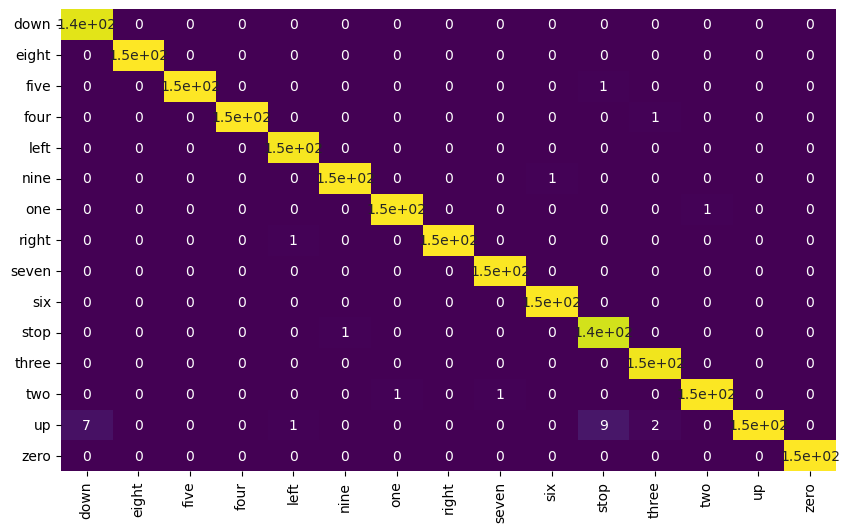

In [28]:
sns.heatmap(confusion_matrix(np.argmax(pred,axis=1), test_data_gen.classes), annot=True, 
            xticklabels=test_data_gen.class_indices.keys(),
           yticklabels=test_data_gen.class_indices.keys(), cbar=False, cmap='viridis')
fig=plt.gcf()
fig.set_size_inches(10,6);

In [29]:
print(classification_report(np.argmax(pred,axis=1), test_data_gen.classes))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98       143
           1       1.00      1.00      1.00       150
           2       1.00      0.99      1.00       151
           3       1.00      0.99      1.00       151
           4       0.99      1.00      0.99       148
           5       0.99      0.99      0.99       150
           6       0.99      0.99      0.99       150
           7       1.00      0.99      1.00       151
           8       0.99      1.00      1.00       149
           9       0.99      1.00      1.00       149
          10       0.93      0.99      0.96       141
          11       0.98      1.00      0.99       147
          12       0.99      0.99      0.99       151
          13       1.00      0.89      0.94       169
          14       1.00      1.00      1.00       150

    accuracy                           0.99      2250
   macro avg       0.99      0.99      0.99      2250
weighted avg       0.99   

In [30]:
model_json = model.to_json()
with open('model_json', 'w') as json_file:
    json_file.write(model_json)